In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import cv2

### 1. Data 불러오기
- copy해서 써야 잘못 편집해도 빠르게 불러올 수 있음!!!

In [16]:
data = pd.read_csv("merged_growth_final.csv", encoding="UTF-8")
data

In [ ]:
cdata = data.copy()

NameError: name 'data' is not defined

In [ ]:
# ### unnamed column 삭제
# cdata.drop(["Unnamed: 0"], axis=1, inplace=True)

In [ ]:
cdata

NameError: name 'cdata' is not defined

##### 1) F0017 필터링

In [ ]:
cols = cdata.columns.to_list()
cols

NameError: name 'cdata' is not defined

In [ ]:
f0017 = cdata[cdata["farm_code"]=="F0017"].reset_index()
f0017.drop(["index"], axis=1, inplace=True)
f0017

NameError: name 'cdata' is not defined

In [ ]:
# import re  
# # 정규표현식 패턴
# pattern = re.compile(r'\d+$')
# ### mask_num 전처리
# for idx, mask in enumerate(f0017["mask_num"]):
#   # 숫자 추출
#   match = re.search(pattern, mask)
#   if match:
#     number = int(match.group()) + 1
#     f0017.iloc[idx, 20] = re.sub(pattern, str(number), mask)

In [ ]:
# ### output_image_path 전처리
# ### 정규표현식 패턴
# pattern = re.compile(r'(\d+)(?=\.\w+$)')
# for idx, path in enumerate(f0017["output_image_path"]):
#   # 숫자 추출
#   match = re.search(pattern, path)
#   if match:
#     number = int(match.group()) + 1
#     f0017.iloc[idx, -1] = re.sub(pattern, str(number), path)

##### 2) 매 달 일주일에 이틀씩 필터링해서 데이터 가져올 수 있도록 하기

In [ ]:
from datetime import datetime, timedelta
import random

def date_extraction(row, input_img_name):
  year = int(row["측정년도"])
  month = int(row["측정월"])
  _, _, img_info, _ = input_img_name.split("-")
  
  day = int(img_info[6:])  # day를 정수형으로 변환합니다.

  # 기준 날짜 생성
  base_date = datetime(year, month, day)

  # 기준 날짜부터 일주일 중 랜덤한 이틀 선택
  dates = []
  selected_dates = random.sample(range(7), 2)  # 0부터 6까지의 숫자 중 2개를 랜덤으로 선택
  for i in selected_dates:
    target_date = base_date + timedelta(days=i)
    dates.append(target_date.strftime("%Y-%m-%d"))

  return dates
  

In [ ]:
result_path = "/home/ubuntu/drive/dataset/SAM_result/F0017/C101/"


In [ ]:
def visualize_mask(df_row, base_folder):
    input_img_name = df_row['input_image_name']  # 이미지 파일명 가져오기
    # dates = date_extraction(df_row, input_img_name)
    mask_id = df_row['output_image_path']  # Mask ID 가져오기
    # print(dates)

    base_folder = base_folder + input_img_name + "/masks/"

    # 이미지 파일 경로 생성
    mask_path = os.path.join(base_folder, mask_id)

    # 이미지 및 마스크 불러오기
    mask = cv2.imread(mask_path)

    return mask, input_img_name, mask_id

### 2. 데이터 탐색

##### 1) 20개
- ~9월 14일 12시
- 열매 한개도 없음

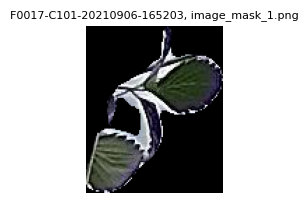

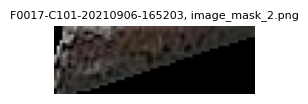

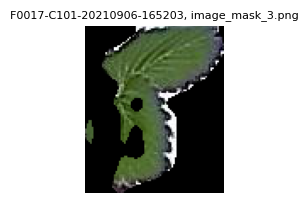

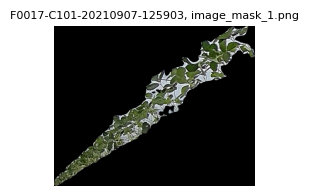

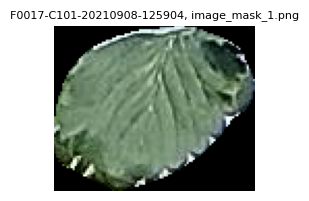

...

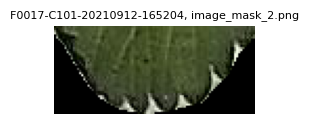

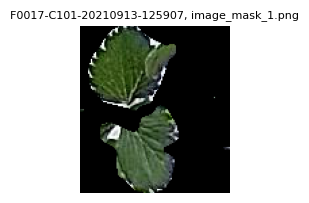

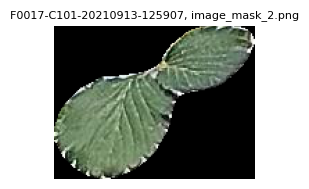

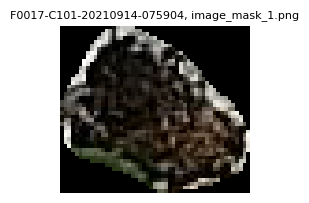

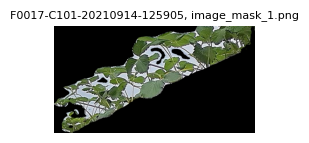

In [ ]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[:20, :].iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 2) 21~40개
- 2021년 9월 14일 16시 ~ 2021년 9월 21일 7시
- 열매가 한개도 없음
- 어떻게 이렇게 잎만 가득가득 잡은거지?

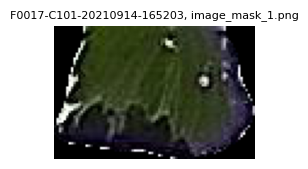

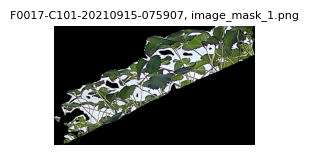

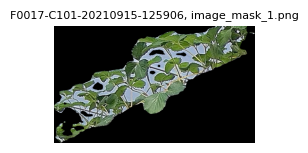

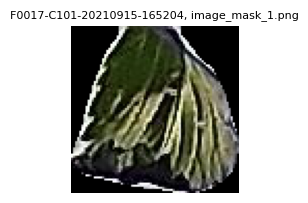

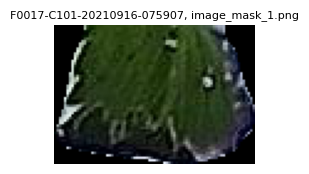

...

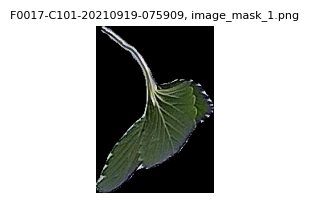

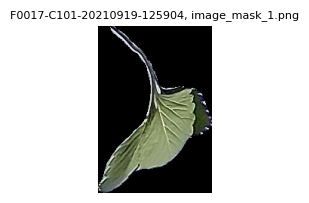

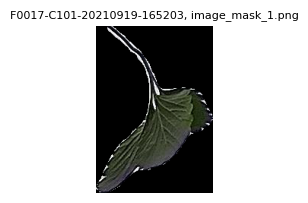

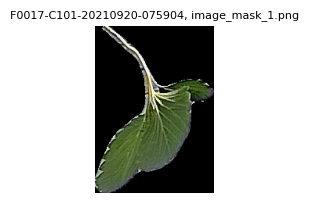

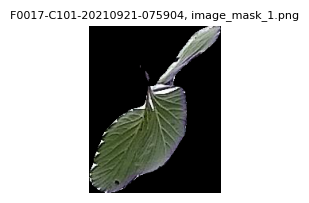

In [15]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[20:40, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 3) 41개 ~ 60개
- 2021년 9월 21일 12시 ~ 2021년 10월 1일 16시
- 마찬가지로 열매가 단 한개도 존재하지 않음

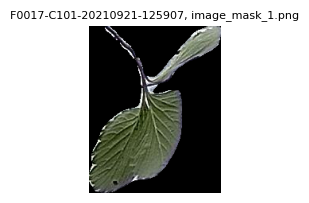

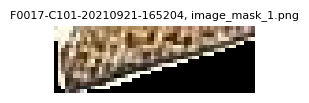

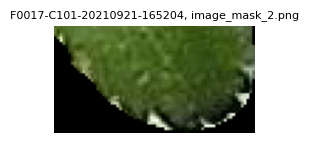

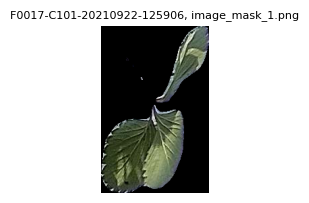

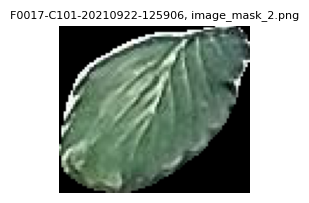

...

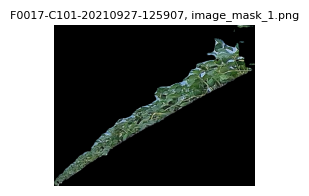

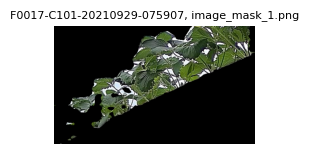

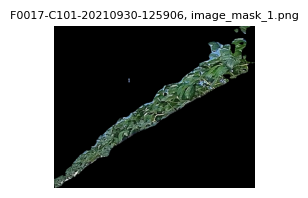

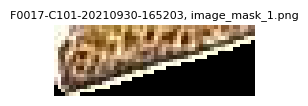

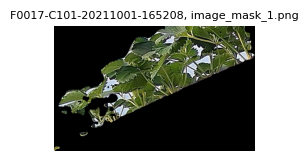

In [16]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[40:60, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 4) 61개 ~ 80개 -> 비료포대
- 2021년 10월 1일 16시 ~ 2021년 10월 9일 12시 <br>
<img src="/home/ubuntu/drive/dataset/result/F0017/C101/F0017-C101-20211003-075905.jpg" width=800px>
- 비료포대에 있는 딸기를 잡아버리는 이 대단한 자식

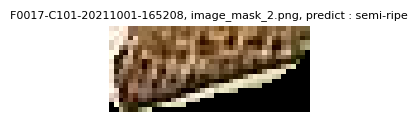

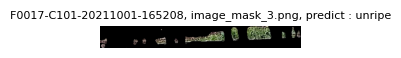

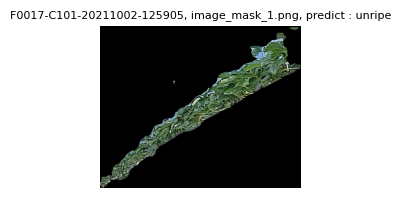

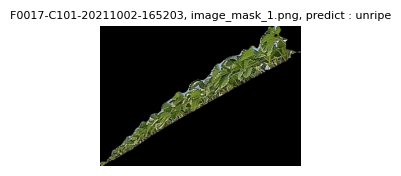

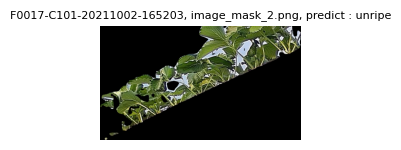

...

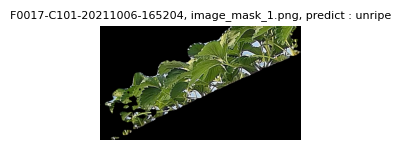

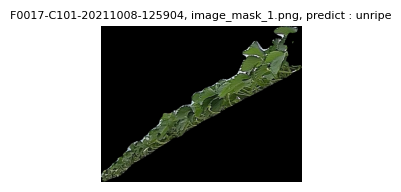

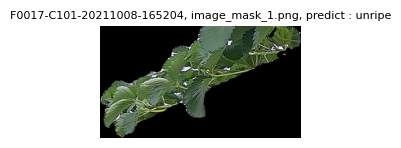

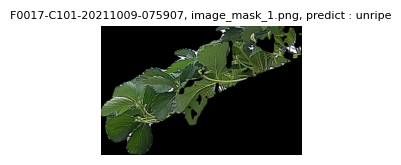

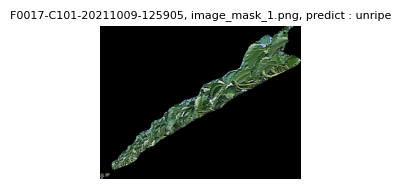

In [17]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[60:80, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')

plt.show()

##### 5) 81개 ~ 100개 -> 비료포대
- 2021년 10월 9일 12시 ~ 2021년 10월 14일 7시 <br>
<img src="/home/ubuntu/drive/dataset/result/F0017/C101/F0017-C101-20211013-165204.jpg" widtt=800px>
- 역시나 또 잡아버린 비료포대의 딸기
- 아직까지 딸기는 나타나지 않음

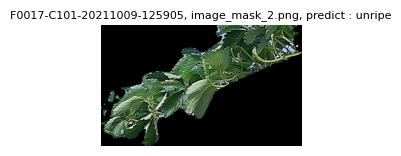

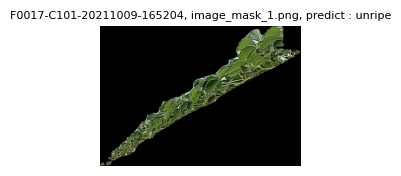

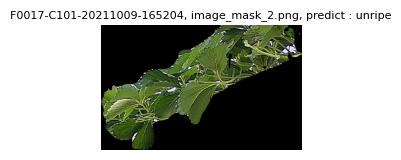

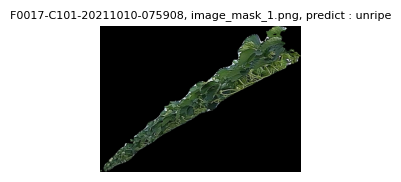

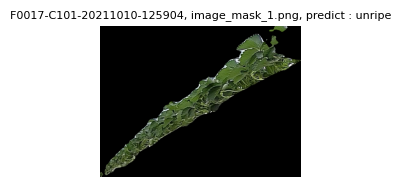

...

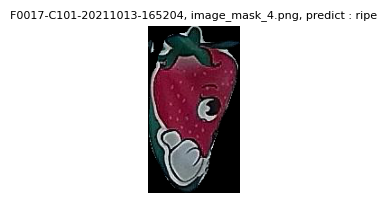

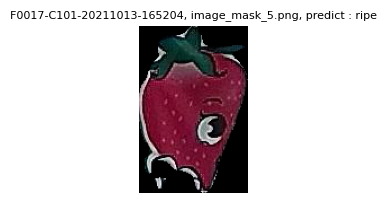

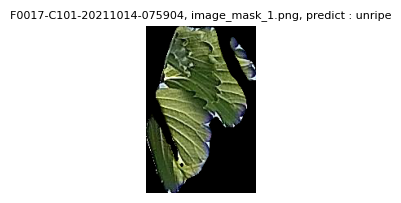

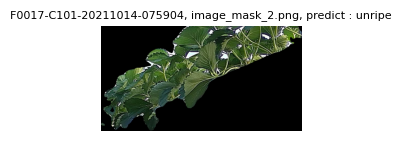

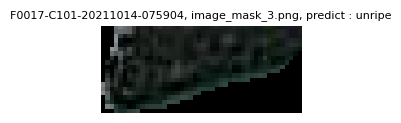

In [18]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[80:100, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')

plt.show()

##### 6) 101개 ~ 120개
- 2021년 10월 14일 12시 ~ 2021년 10월 19일 7시
- 여전히 딸기는 잡히지 않음

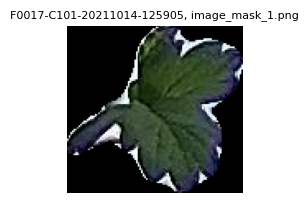

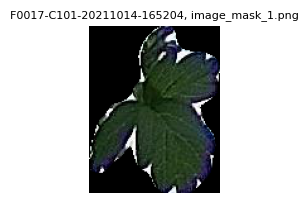

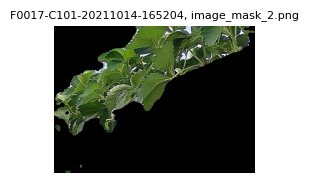

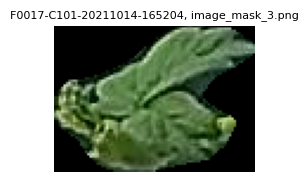

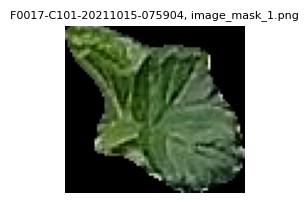

...

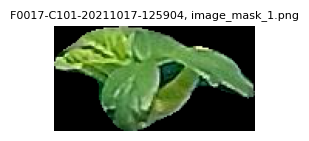

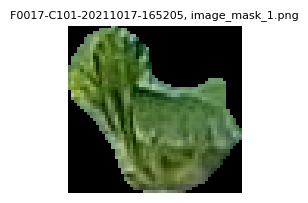

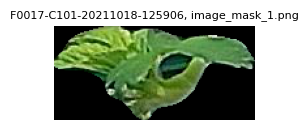

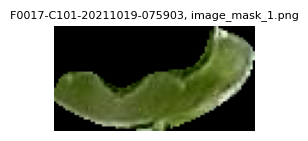

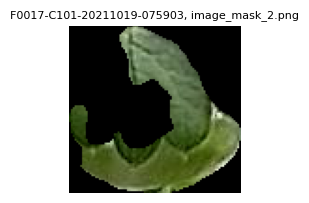

In [19]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[100:120, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 7) 121개 ~ 140개
- 2021년 10월 21일 12시 ~ 2021년 10월 24일 16시
- 19일 12시부터 21일 7시에 잡힌 마스크가 하나도 없음
- 딸기도 아직까지 잡힌 것이 없음 

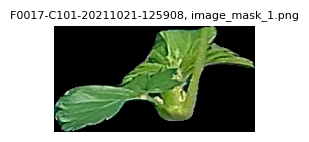

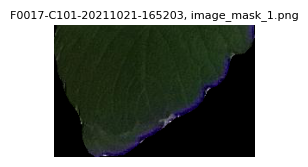

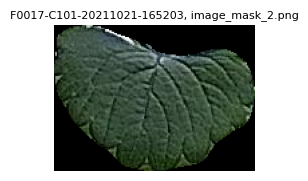

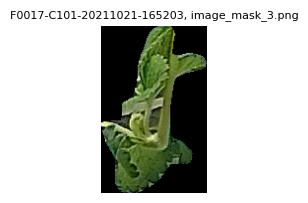

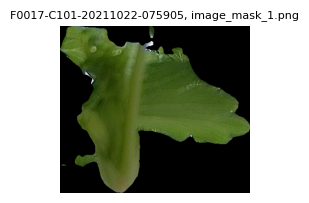

...

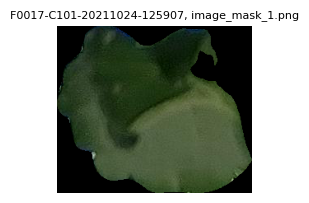

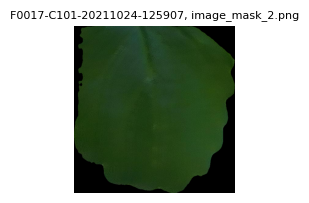

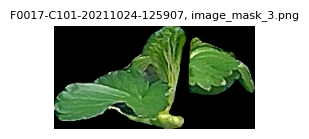

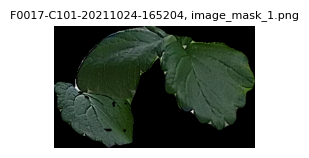

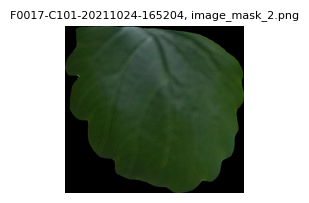

In [20]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[120:140, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 8) 141개 ~ 160개
- 2021년 10월 24일 16시 ~ 2021년 11월 2일 7시
- 딸기 마스크가 잡힌 것은 아직도 없음
- 다 풀잎

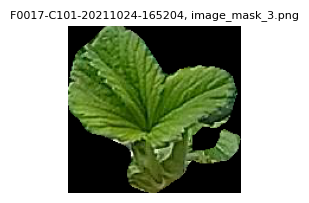

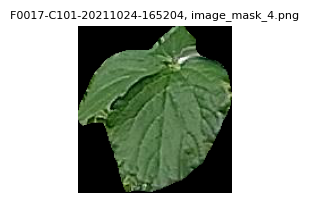

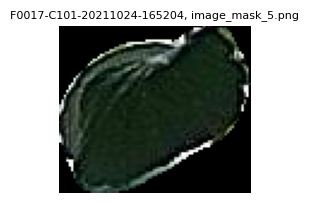

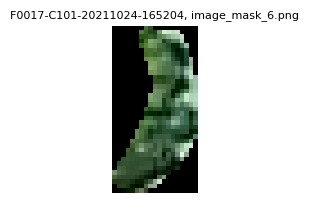

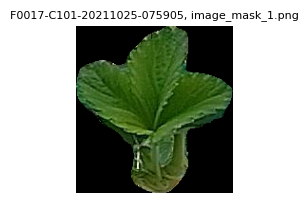

...

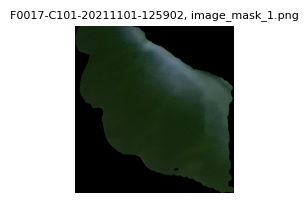

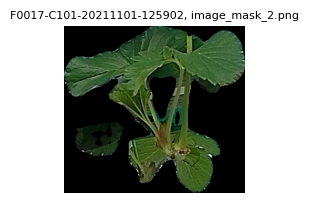

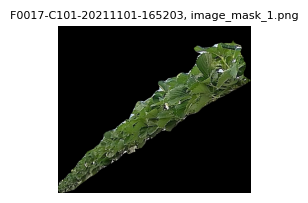

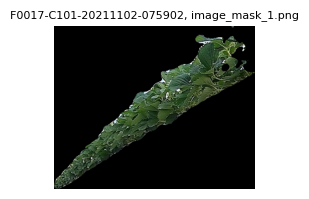

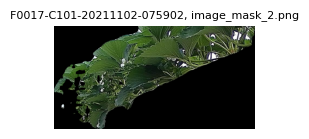

In [21]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[140:160, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 9) 161개 ~ 180개
- 2021년 11월 2일 12시 ~ 2021년 11월 6일 7시
- 딸기 꽃이 피고 있는 시기
- 아직까지 열매는 잡히지 않음

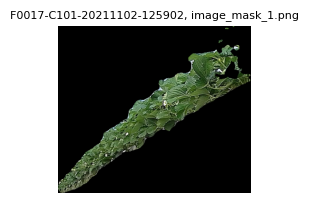

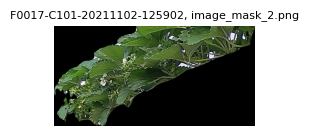

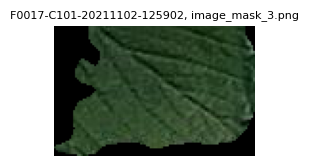

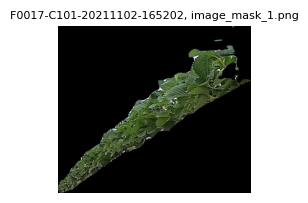

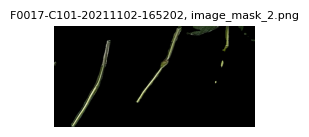

...

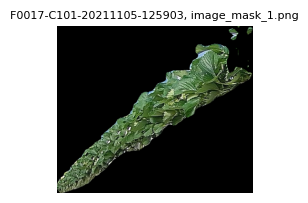

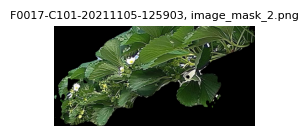

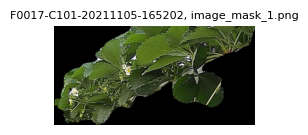

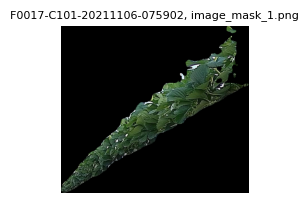

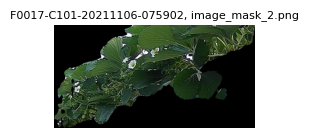

In [22]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[160:180, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 10) 181개 ~ 200개
- 2021년 11월 6일 12시 ~ 2021년 11월 9일 16시
- 2021년 11월 8일 7시 첫 딸기 등장

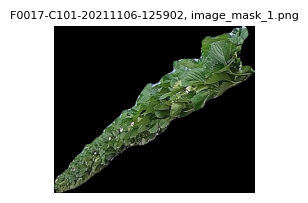

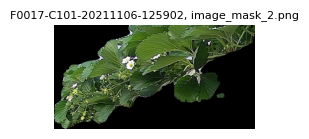

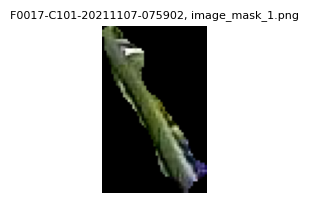

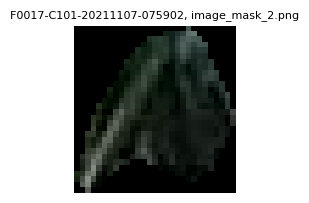

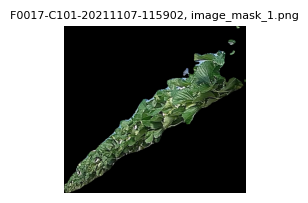

...

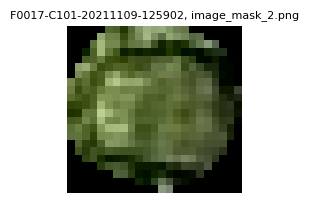

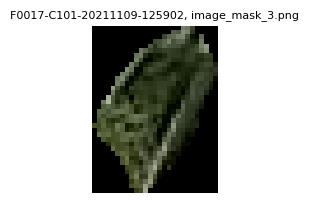

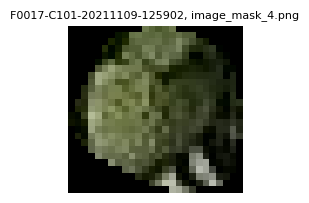

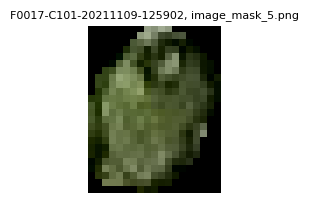

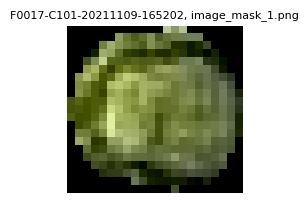

In [23]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[180:200, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}', fontsize=8)
    plt.axis('off')

plt.show()

##### 11) 201개 ~ 220개
- 2021년 11월 9일 16시 ~ 2021년 11월 10일 16시 <br>
<img src="/home/ubuntu/drive/dataset/SAM_result/F0017/C101/F0017-C101-20211110-075902/masks/image_mask_4.png" width=200>
- 글씨가 겹친 경우 존재, 이부분은 rgb 필터링으로 치워버려도 될 것 같은데?
- rgb 필터링 기준을 이 글씨 기준으로 잡는건 어떨지?
- 일단 글씨가 포함된 상태로 모델을 돌렸을 때 어떤 결과를 뱉는지도 보면 좋을 듯
  - 초록 딸기는 아직 잘 잡음 semi-ripe이나 ripe에 영향을 미치는지 확인해봐야 할 듯

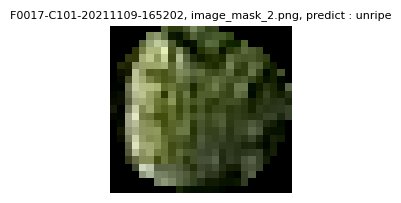

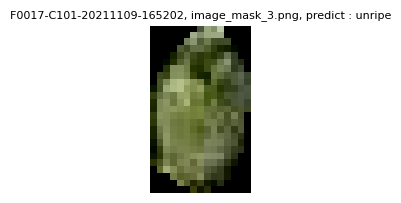

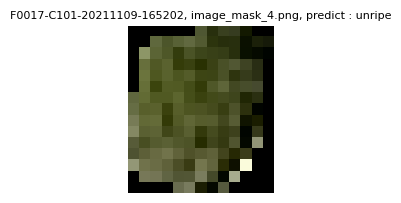

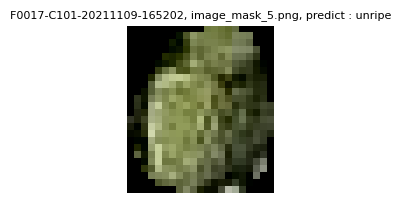

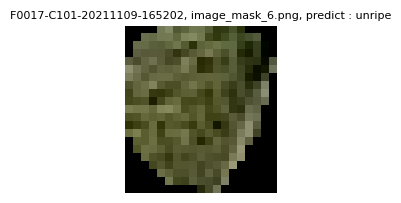

...

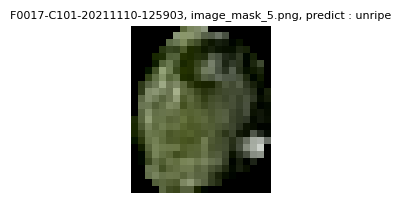

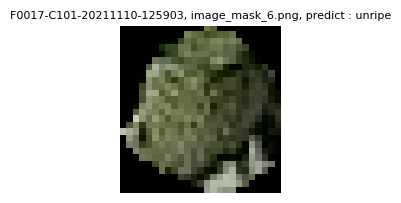

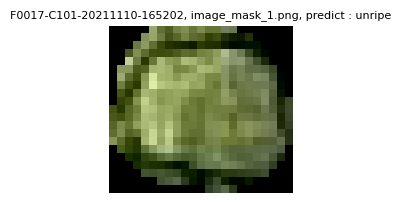

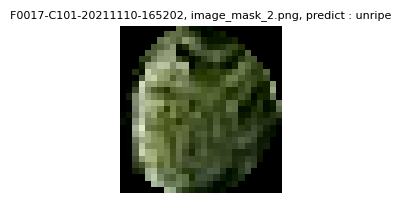

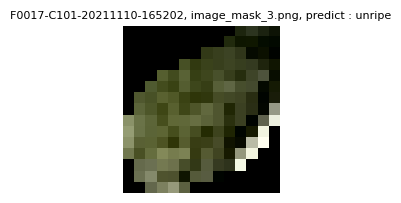

In [24]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[200:220, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')

plt.show()

##### 12) 221개 ~ 240개
- 2021년 11월 10일 16시 ~ 2021년 11월 11일 16시
- 여전히 잎 무더기가 잡히고 있음
- 픽셀 사이즈로 잡아내야 할 것 같음

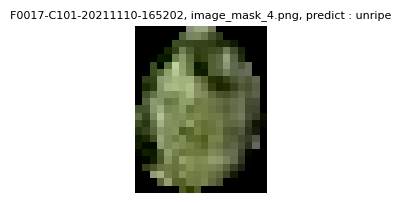

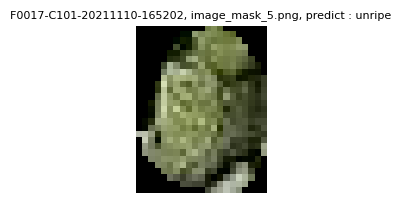

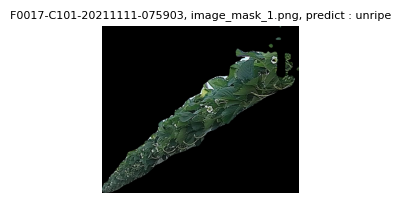

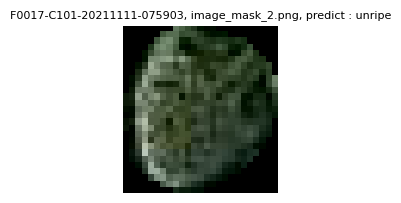

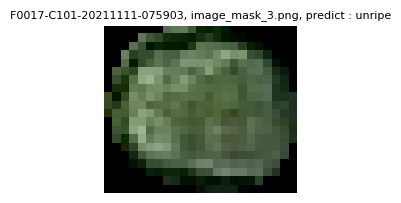

...

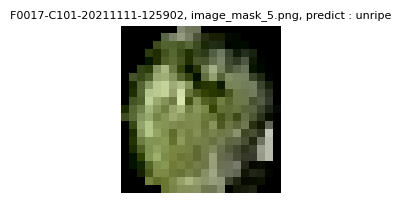

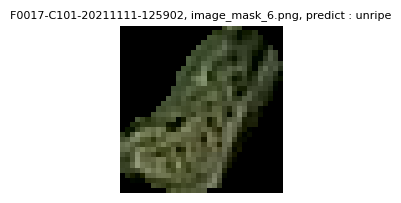

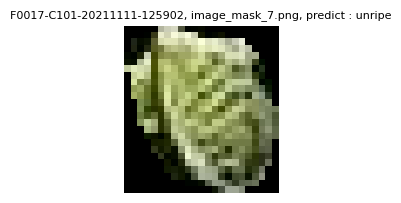

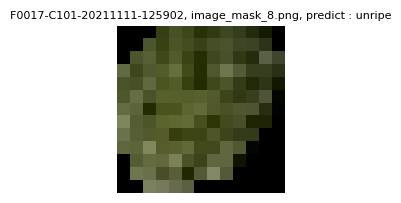

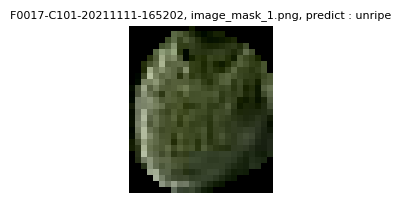

In [25]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[220:240, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')

plt.show()

##### 13) 241개 ~ 260개
- 2021년 11월 11일 16시 ~ 2021년 11월 12일 16시
- 딸기인지 의문이 가는 것들이 존재
- 하나하나 눈으로 확인해봐야 할 것인가?
- 눈으로 확인 안하고 자동화할 수 있는 방법이 없을까?

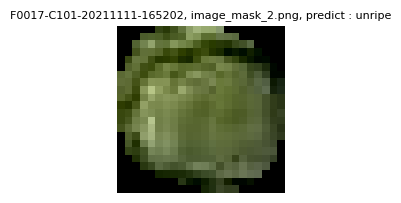

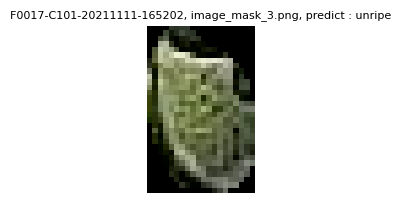

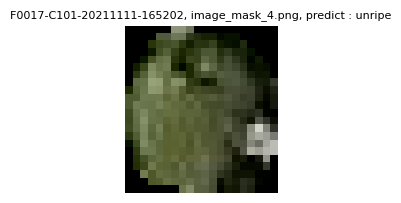

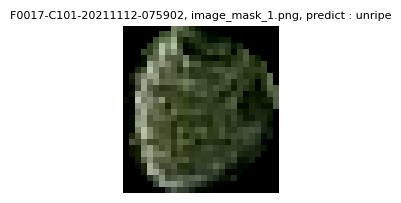

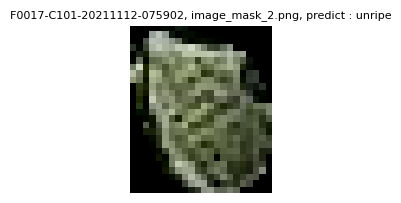

...

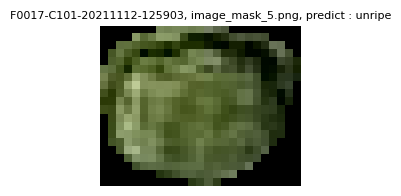

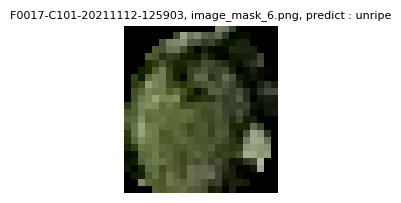

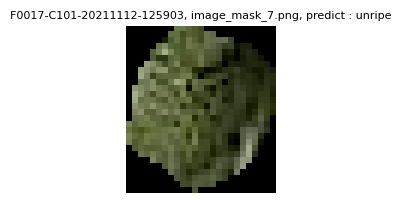

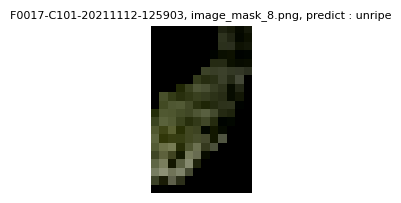

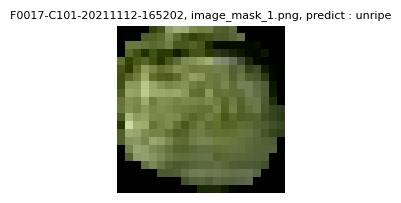

In [26]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[240:260, :].reset_index().iterrows(): 
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 5, idx+1)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')

plt.show()

##### 14) 261개 ~ 280개
- 2021년 11월 12일 16시 ~ 2021년 11월 14일 12시
- 잎이 또 잡혔네?

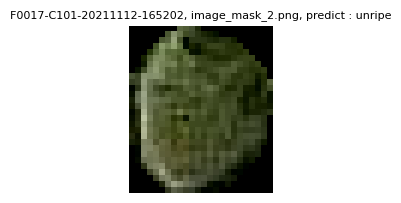

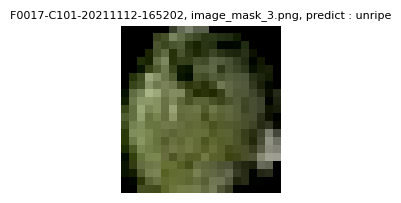

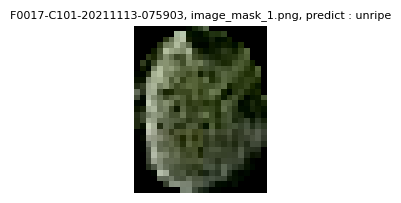

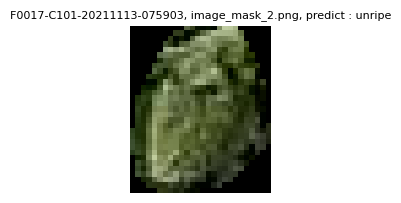

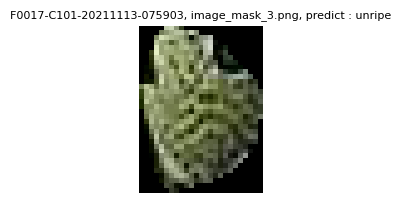

...

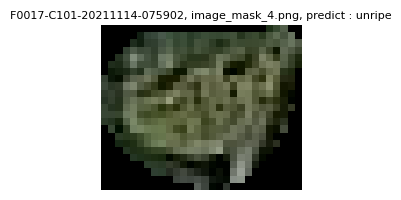

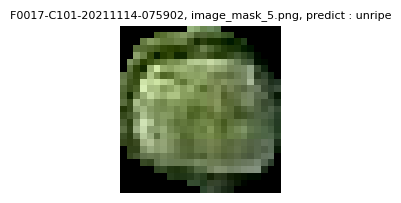

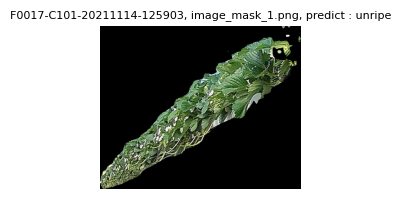

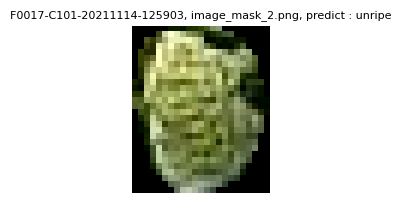

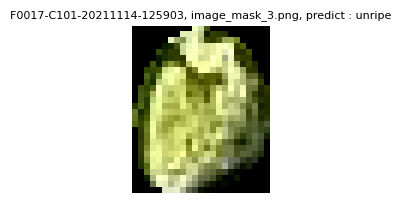

In [27]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[260:280, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

##### 15) 281개 ~ 300개
- 2021년 11월 14일 12시 ~ 2021년 11월 15일 12시
- 여전히 잎 무더기가 잡힘

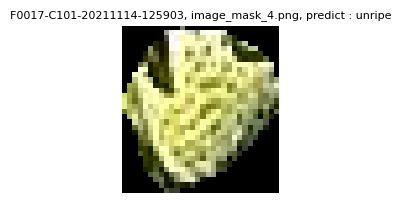

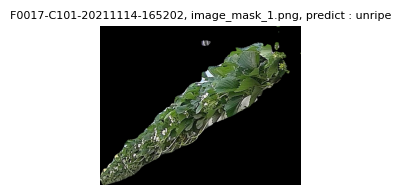

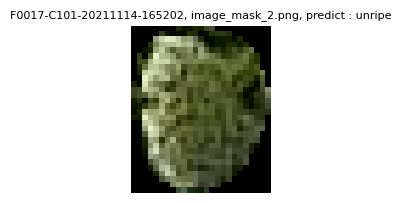

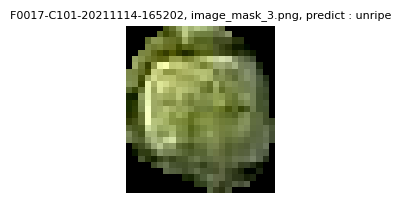

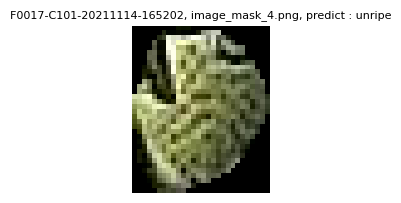

...

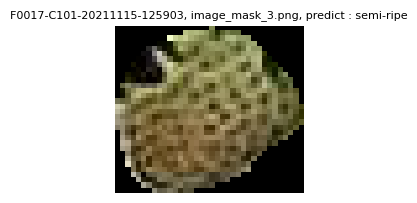

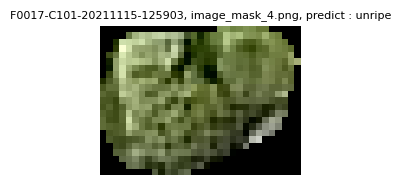

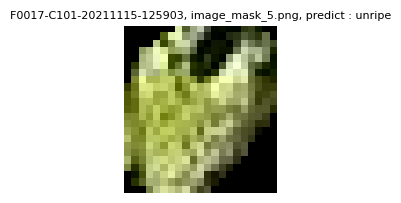

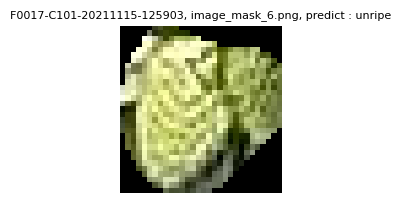

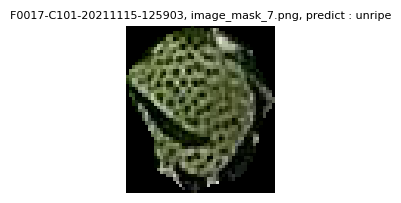

In [28]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[280:300, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

##### 16) 301개 ~ 320개 -> 비료포대
- 2021년 11월 15일 12시 ~ 2021년 11월 16일 7시 <br>
<img src="/home/ubuntu/drive/dataset/SAM_result/F0017/C101/F0017-C101-20211115-165202/bbox/F0017-C101-20211115-165202.png" width=800px>
- 미치겠네 ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ 진짜 어이없음 이걸 왜잡아 이게 어딜봐서 딸기냐고

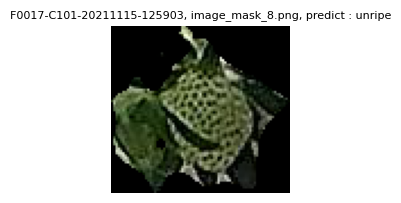

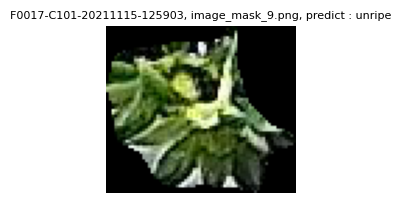

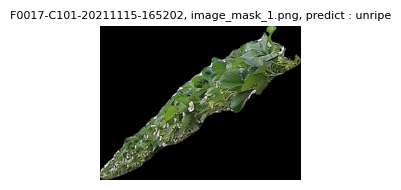

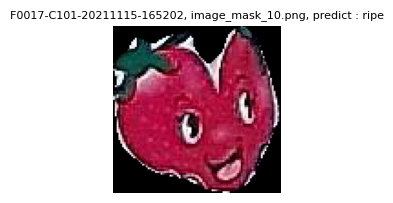

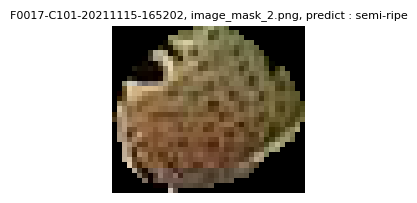

...

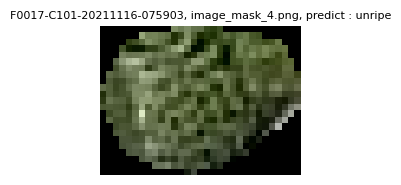

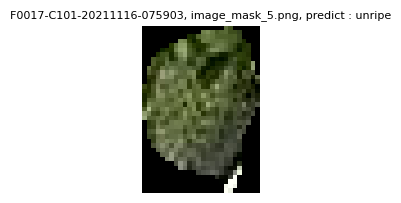

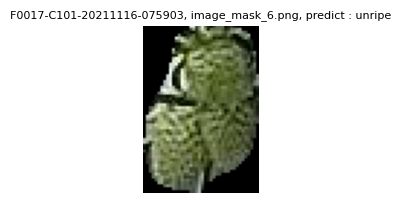

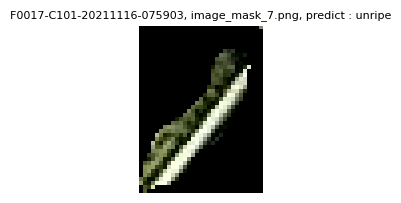

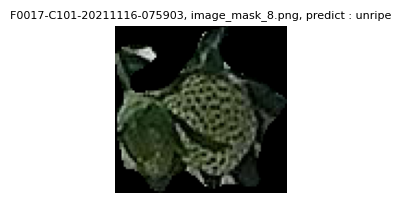

In [29]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[300:320, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

##### 17) 321개 ~ 340개 -> 비료포대
- 2021년 11월 16일 11시 ~ 2021년 11월 16일 15시
- 비료포대 미친 것
- 이건 수기로 지워줘야할 것 같기도.. 아니면 유사한 색구성을 가진 애를 삭제하도록 할 수 있을까?
- 비료포대 예측값이 nan이네? 위에도 그런가? -> 다그런건 아님 예측값 존재하는 애들도 있음 -> 응아니야

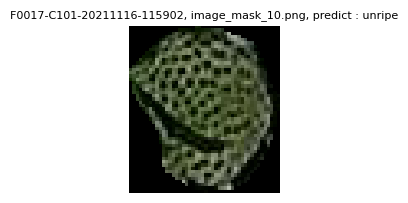

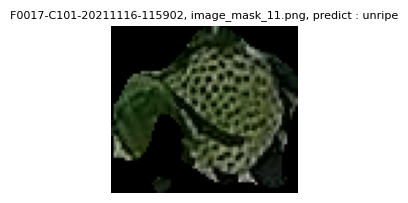

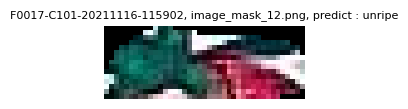

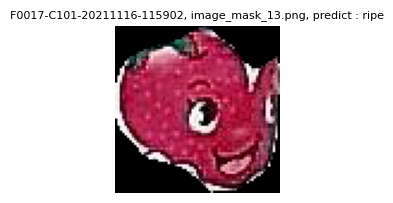

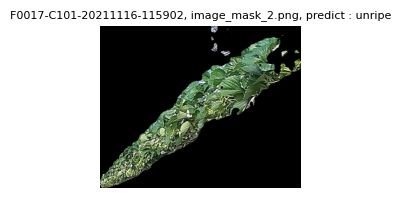

...

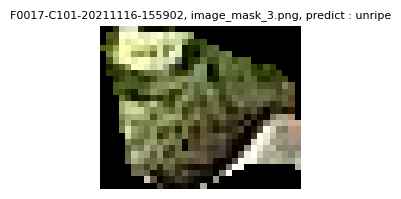

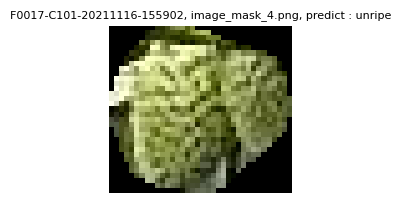

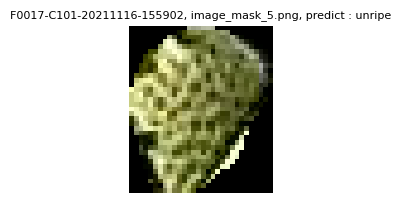

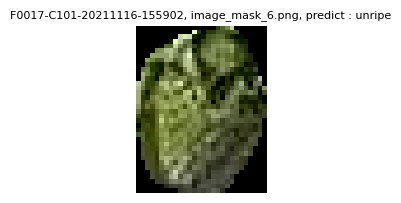

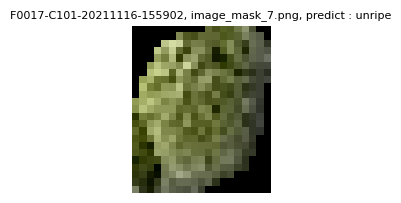

In [30]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[321:340, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

##### 18) 341개 ~ 360개
- 2021년 11월 16일 15시 ~ 2021년 11월 17일 11시 <br>
<img src="/home/ubuntu/drive/dataset/SAM_result/F0017/C101/F0017-C101-20211117-075903/bbox/F0017-C101-20211117-075903.png" width=800px>
- 바운딩 박스는 잘 그려졌으나, 뒤에 딸기를 잡으라고 그린건데 줄기만 마스크로 뽑아낸 경우 존재
- 미친 것.

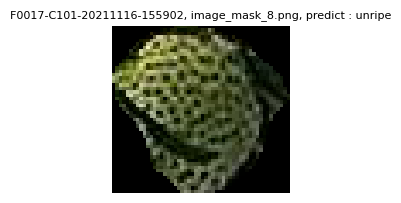

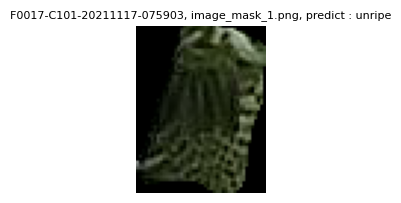

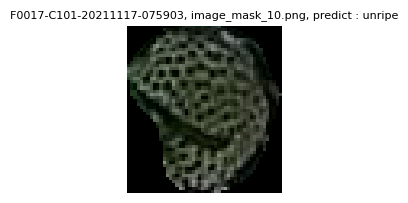

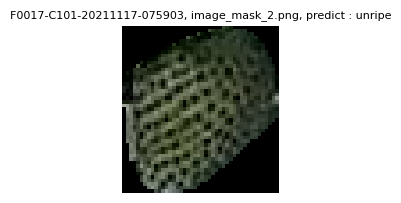

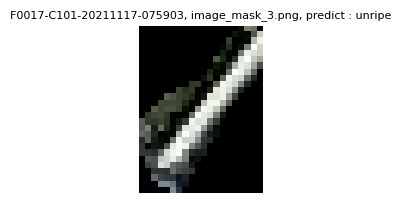

...

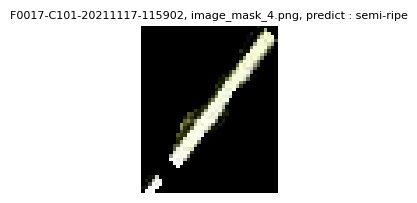

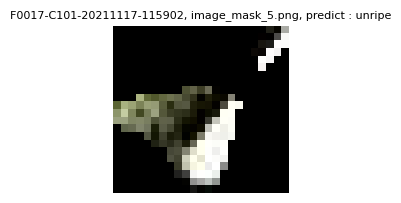

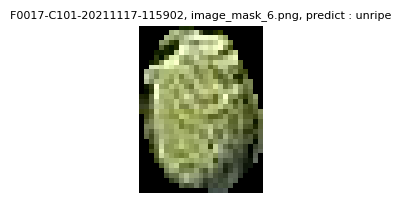

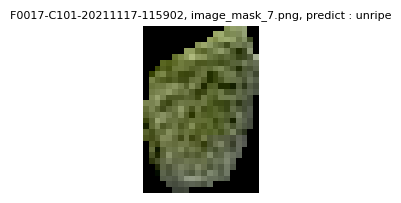

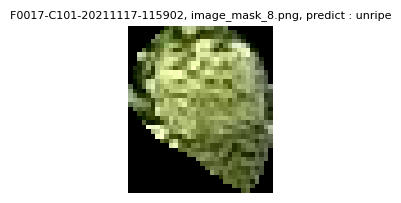

In [31]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[340:360, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

##### 19) 361개 ~ 380개
- 2021년 11월 17일 11시 ~ 2021년 11월 18일 7시
- 줄기에 가려진 부분 -> 줄기만 추출됨

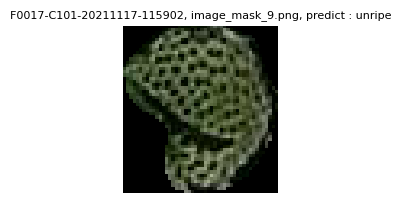

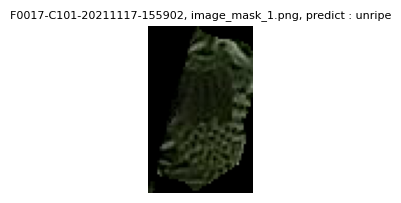

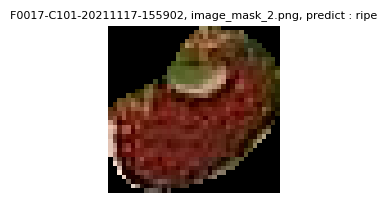

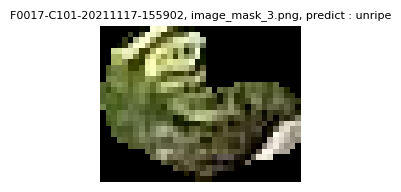

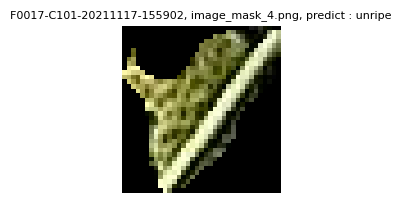

...

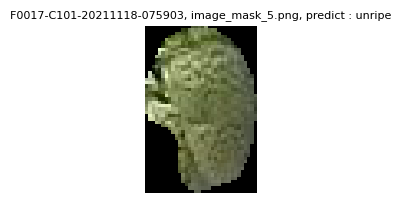

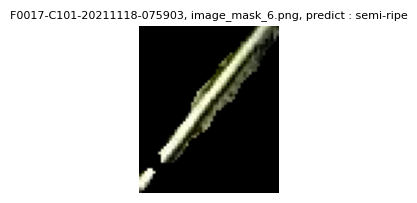

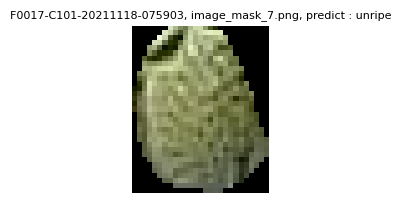

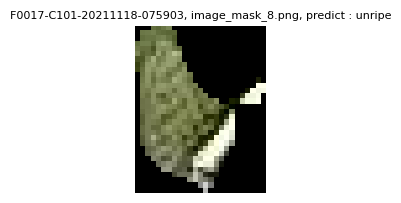

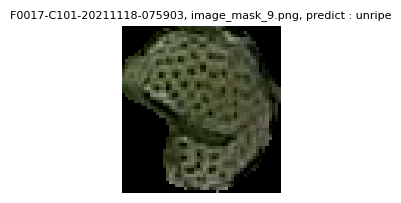

In [32]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[360:380, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

##### 20) 381개 ~ 400개
- 2021년 11월 18일 13시 ~ 2021년 11월 18일 15시
- 줄기만 잡힌 부분 존재
- 보라색.. 뭐지? -> 좌측 상단의 작은 박스들이 보라색 딸기 <br>
<img src="/home/ubuntu/drive/dataset/SAM_result/F0017/C101/F0017-C101-20211118-135903/bbox/F0017-C101-20211118-135903.png" width=800px>

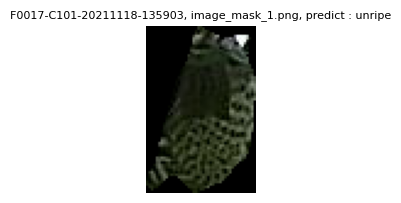

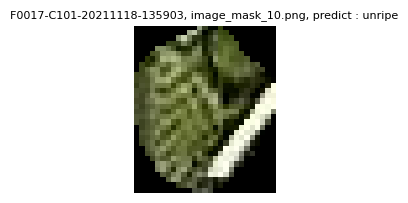

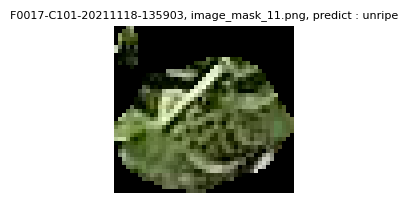

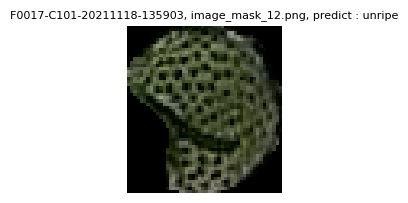

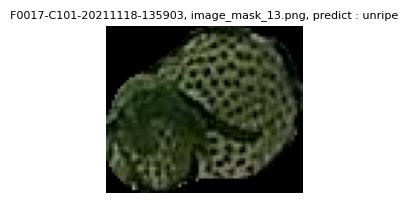

...

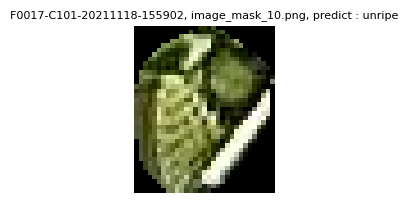

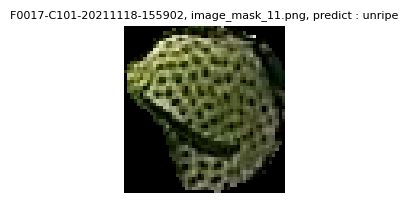

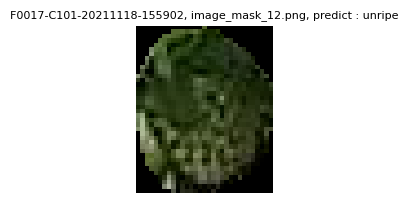

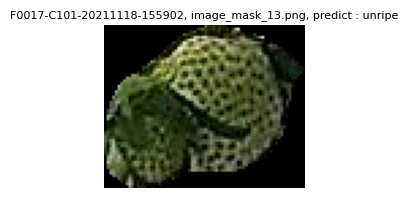

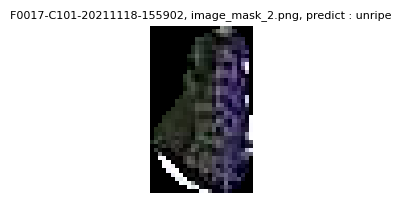

In [33]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[380:400, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

##### 21) 401개 ~ 420개
- 보라색 딸기...... 미친 것.......
- 진짜 어떡하지???????

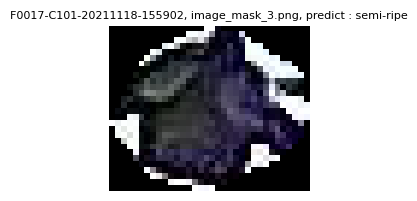

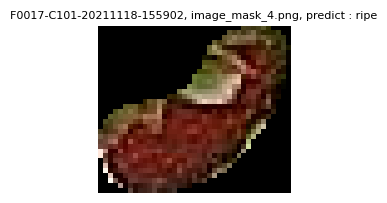

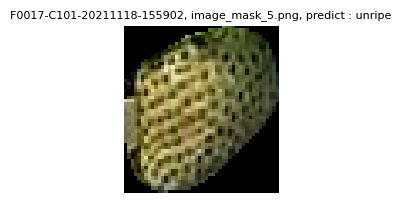

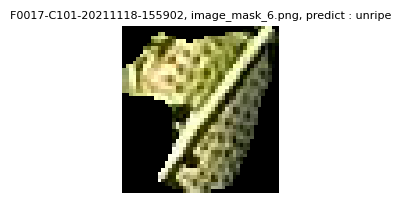

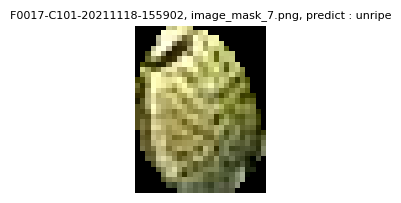

...

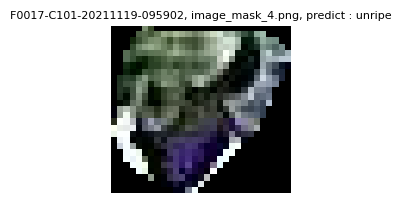

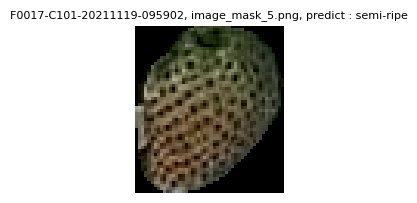

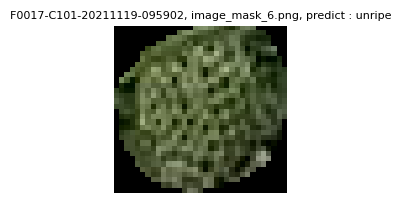

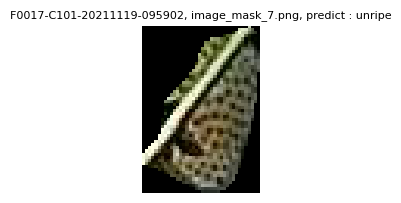

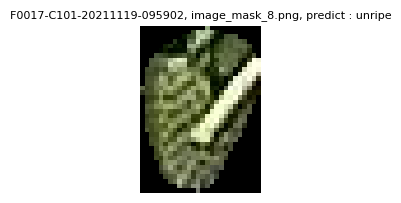

In [34]:
# 각 행에 대해 visualize_mask 함수 호출
for idx, row in f0017.iloc[400:420, :].reset_index().iterrows(): 
  mask, img_name, mask_name = visualize_mask(row, result_path)
  # 이미지 및 마스크 시각화
  plt.figure(figsize=(15, 10))
  plt.subplot(4, 5, idx+1)
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
  plt.axis('off')

plt.show()

### 3. 같은 딸기 시간순으로 나열하기

In [13]:
f0017_unique = list(f0017["mask_id"].unique())
f0017_unique

NameError: name 'f0017' is not defined

In [14]:
f0017["mask_id"].value_counts()

NameError: name 'f0017' is not defined

In [23]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def visualize_images(image_paths):
    num_images = len(image_paths)
    fig, axs = plt.subplots(1, num_images, figsize=(15, 5))

    for i, img_path in enumerate(image_paths):
        img = mpimg.imread(img_path)
        axs[i].imshow(img)
        axs[i].axis('off')

    plt.show()

##### 1) 21-22 작기 11월
- 첫 unripe 딸기가 나타났을 때

In [27]:
f0017_2122_11 = f0017[(f0017["측정년도"] == 2021) & (f0017["측정월"] == 11)].reset_index().drop(["index"], axis=1)
f0017_2122_11

,check_datetime,측정일자,구역명,farm_code,내부온도,내부습도,내부CO2,근권온도,내부순간일사량,측정년도,...,mask_id,point_x,point_y,size,color,output_image_path,origin_r,origin_g,origin_b,pred_growth
0,2021-11-01 08:00:00,2021-11-01,1구역,F0017,16.05,91.07,1015.60,16.82,30.49,2021.0,...,0ca6e0a78d287111050a4af0eb3c19a0,2116.089111,273.541412,47670,"[[46, 82, 72], [60, 96, 86], [68, 104, 94], [6...",image_mask_1.png,0.298072,0.448321,0.253607,unripe
1,2021-11-01 13:00:00,2021-11-01,1구역,F0017,22.08,60.26,473.40,17.29,139.22,2021.0,...,fad9b9cc00573a70bef1620872734aa9,1031.461792,277.531586,162998,"[[22, 37, 18], [21, 36, 17], [20, 35, 16], [20...",image_mask_1.png,0.274513,0.456223,0.269264,unripe
2,2021-11-01 13:00:00,2021-11-01,1구역,F0017,22.08,60.26,473.40,17.29,139.22,2021.0,...,670864a7afa22a3ff34dc1f0a9ed0897,2115.139648,289.802917,49836,"[[0, 37, 19], [9, 46, 28], [32, 69, 51], [5, 4...",image_mask_2.png,0.307667,0.456531,0.235802,unripe
3,2021-11-01 16:50:00,2021-11-01,1구역,F0017,17.67,63.37,495.40,18.42,15.10,2021.0,...,682854e695af6a15ddf19e818b949420,336.672028,444.137909,86044,"[[71, 106, 26], [67, 102, 22], [102, 134, 49],...",image_mask_1.png,0.341257,0.422460,0.236283,unripe
4,2021-11-02 08:00:00,2021-11-02,1구역,F0017,16.60,91.74,974.33,16.60,40.31,2021.0,...,682854e695af6a15ddf19e818b949420,337.362183,439.118103,79236,"[[7, 28, 23], [43, 66, 58], [17, 38, 33], [8, ...",image_mask_1.png,0.311811,0.416428,0.271761,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
847,2021-11-30 16:50:00,2021-11-30,1구역,F0017,14.45,91.43,477.40,15.22,0.00,2021.0,...,167250cd99e21b86a381686cab560708,152.827271,288.797668,2239,"[[23, 36, 16], [23, 37, 14], [19, 33, 10], [16...",image_mask_5.png,0.352024,0.402158,0.245818,unripe
848,2021-11-30 16:50:00,2021-11-30,1구역,F0017,14.45,91.43,477.40,15.22,0.00,2021.0,...,446807a9d97275b6adf802ed15368377,97.361565,292.815338,1759,"[[49, 58, 41], [50, 59, 42], [43, 52, 35], [74...",image_mask_6.png,0.346248,0.372755,0.280997,unripe
849,2021-11-30 16:50:00,2021-11-30,1구역,F0017,14.45,91.43,477.40,15.22,0.00,2021.0,...,3432cc1f57ed7e80d4e0e855215ea50b,258.954437,8.887859,844,"[[69, 43, 26], [73, 42, 24], [56, 19, 1], [71,...",image_mask_7.png,0.561775,0.261789,0.176436,ripe
850,2021-11-30 16:50:00,2021-11-30,1구역,F0017,14.45,91.43,477.40,15.22,0.00,2021.0,...,4f7abbd42d0deb966f825e47b9c66f0e,122.853058,374.092499,3350,"[[39, 54, 31], [37, 52, 29], [47, 62, 39], [76...",image_mask_8.png,0.353166,0.418187,0.228647,unripe


In [29]:
f0017_2122_11.columns

Index(['check_datetime', '측정일자', '구역명', 'farm_code', '내부온도', '내부습도', '내부CO2',
       '근권온도', '내부순간일사량', '측정년도', '측정월', 'input_image_name',
       'input_image_path', 'img_id', 'area_code', 'shot_datetime',
       'count_masks', 'bbox_image_path', 'before_img_name', 'before_img_id',
       'mask_num', 'mask_id', 'point_x', 'point_y', 'size', 'color',
       'output_image_path', 'origin_r', 'origin_g', 'origin_b', 'pred_growth'],
      dtype='object')

In [19]:
mask_id_11 = f0017_2122_11["mask_id"].value_counts().index
mask_id_11

Index(['ce2c9dce309e20483a8d7986fc29fc1d', '8967064896cab0a09e5b78851bf7745a',
       'cfaf6a90214892915bd56fd49e019958', '682854e695af6a15ddf19e818b949420',
       '297da16a815db894fe8daab3c67acf58', 'e618c8da63ecdeb7bcc8ad417a6b190b',
       '446807a9d97275b6adf802ed15368377', '5b8a457ddc6bd539c3f882639b2fcddb',
       '8f3e13bdca61bea490aba37d08c811a6', 'e3f9b2edf149154bd75c10b6828843d7',
       ...
       'f9086129b2914f2d3c79bfc116a19e2d', 'bc8278a5290c4d3dd40576b080221953',
       '070204925a64416c519b7eae588d22fb', 'fad9b9cc00573a70bef1620872734aa9',
       'c48c0bca6d227ada0cd0e2dc370f97a2', '34d36576565dde3ac7962d1dc537fdaf',
       '33f3776f6c4ffb690867e9508f0848cd', '6d998a2f15883e997efbf36da67e30d8',
       '55aa29c63db5a0c2fc3fba08b089a2dd', '5e071def4679d224d5835601b12e6d3c'],
      dtype='object', name='mask_id', length=173)

In [1]:
for idx, mask in enumerate(mask_id_11):
  same_mask = f0017_2122_11[f0017_2122_11["mask_id"] == mask]
  img_path_list = []
  for i, row in same_mask.iterrows():
    img_path_list.append("/home/ubuntu/drive/dataset/SAM_result/F0017/C101/" + row["input_image_name"] + "/masks/" + row["output_image_path"])
  visualize_images(img_path_list)
  

NameError: name 'mask_id_11' is not defined

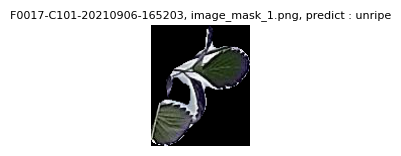

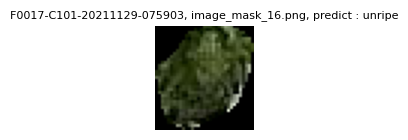

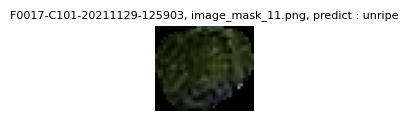

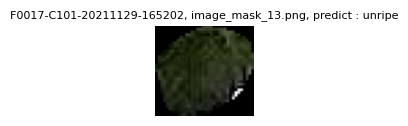

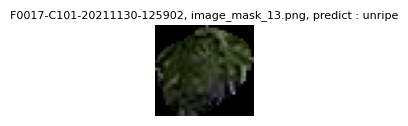

In [15]:
i = 1
for idx, row in f0017[:1000].iterrows():
  if row["mask_id"] == f0017_unique[0]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

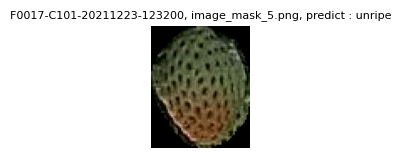

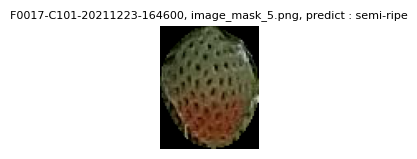

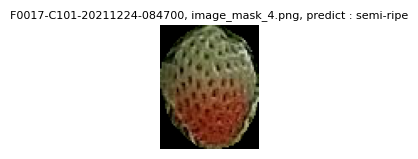

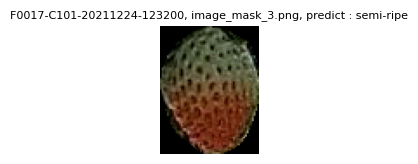

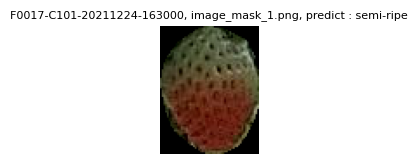

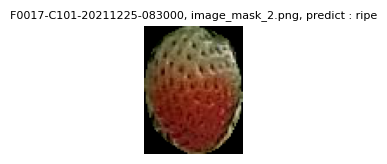

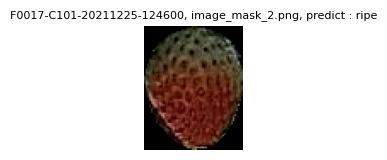

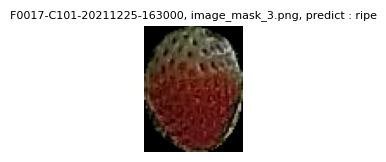

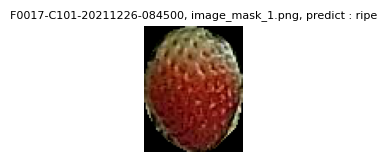

In [16]:
i = 1
for idx, row in f0017[1000:5000].iterrows():
  if row["mask_id"] == f0017_unique[0]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

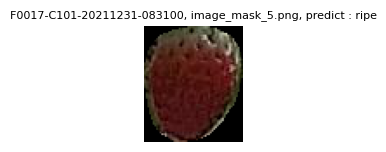

In [17]:
i = 1
for idx, row in f0017[5000:10000].iterrows():
  if row["mask_id"] == f0017_unique[0]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

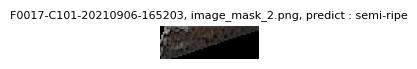

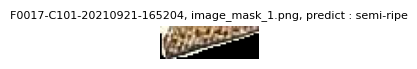

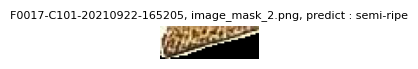

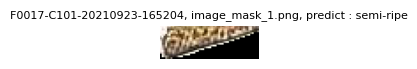

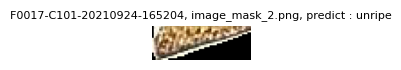

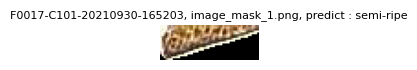

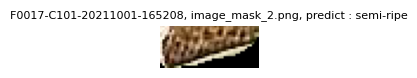

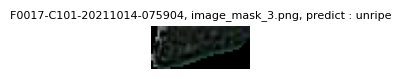

In [18]:
i = 1
for idx, row in f0017[:100].iterrows():
  if row["mask_id"] == f0017_unique[1]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

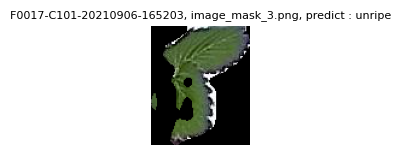

In [19]:
i = 1
for idx, row in f0017[:10000].iterrows():
  if row["mask_id"] == f0017_unique[2]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

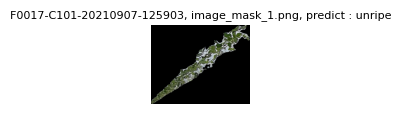

In [20]:
i = 1
for idx, row in f0017[:20000].iterrows():
  if row["mask_id"] == f0017_unique[3]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

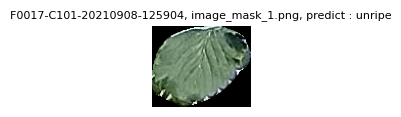

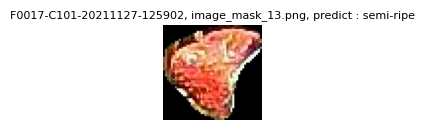

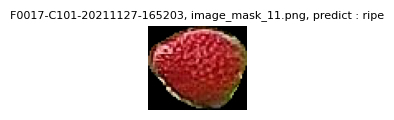

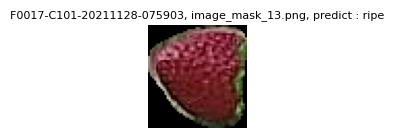

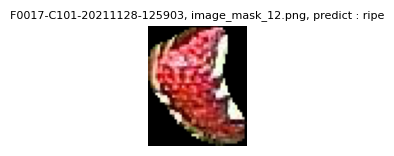

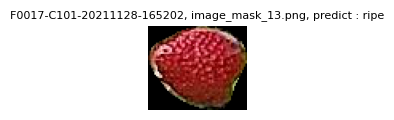

In [21]:
i = 1
for idx, row in f0017[:10000].iterrows():
  if row["mask_id"] == f0017_unique[4]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

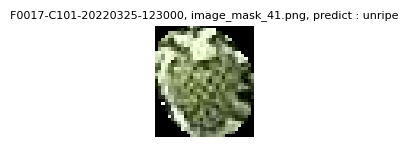

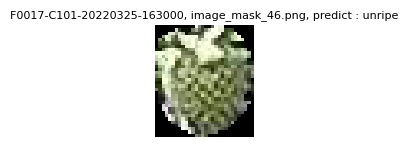

In [22]:
i = 1
for idx, row in f0017[10000:30000].iterrows():
  if row["mask_id"] == f0017_unique[4]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

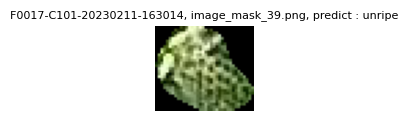

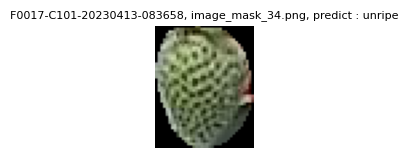

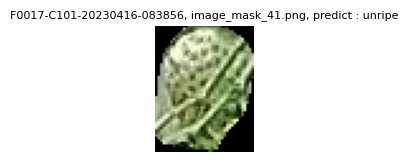

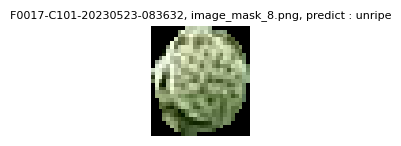

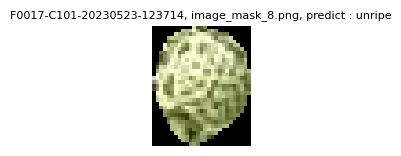

In [35]:
i = 1
for idx, row in f0017[50000:70000].iterrows():
  if row["mask_id"] == f0017_unique[4]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

In [36]:
i = 1
for idx, row in f0017[70000:].iterrows():
  if row["mask_id"] == f0017_unique[4]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

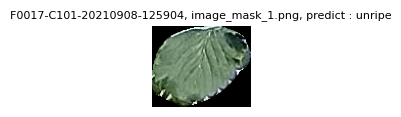

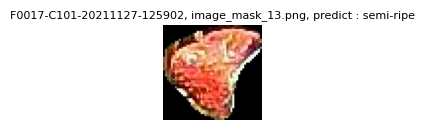

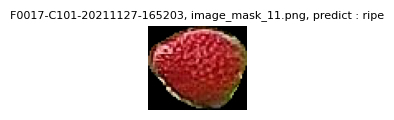

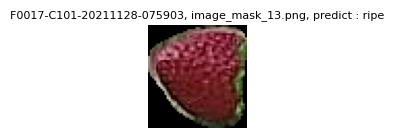

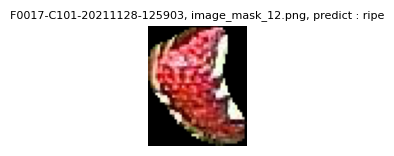

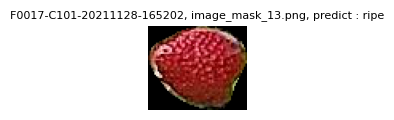

In [34]:
i = 1
for idx, row in f0017[:10000].iterrows():
  if row["mask_id"] == f0017_unique[4]:
    mask, img_name, mask_name = visualize_mask(row, result_path)
    # 이미지 및 마스크 시각화
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 10, i)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title(f'{img_name}, {mask_name}, predict : {row["pred_growth"]}', fontsize=8)
    plt.axis('off')
    i+=1
  plt.show()

### 4.데이터 날라간 부분 확인하기

In [47]:
f0017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87529 entries, 0 to 87528
Data columns (total 31 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   check_datetime     86517 non-null  object 
 1   측정일자               86517 non-null  object 
 2   구역명                86517 non-null  object 
 3   farm_code          87529 non-null  object 
 4   내부온도               86517 non-null  float64
 5   내부습도               86517 non-null  float64
 6   내부CO2              86517 non-null  float64
 7   근권온도               86517 non-null  float64
 8   내부순간일사량            86517 non-null  float64
 9   측정년도               86517 non-null  float64
 10  측정월                86517 non-null  float64
 11  input_image_name   87529 non-null  object 
 12  input_image_path   87529 non-null  object 
 13  img_id             87529 non-null  object 
 14  area_code          87529 non-null  object 
 15  shot_datetime      87529 non-null  object 
 16  count_masks        875

In [48]:
f0017_re = pd.read_csv("result_f0017.csv")

/tmp/ipykernel_43178/3026851651.py:1: DtypeWarning: Columns (11,12,13,14,15,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  f0017_re = pd.read_csv("result_f0017.csv")


In [49]:
f0017_re.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421399 entries, 0 to 421398
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   check_datetime    421376 non-null  object 
 1   측정일자              421376 non-null  object 
 2   구역명               421376 non-null  object 
 3   farm_code         421399 non-null  object 
 4   내부온도              421376 non-null  float64
 5   내부습도              421376 non-null  float64
 6   내부CO2             421376 non-null  float64
 7   근권온도              421376 non-null  float64
 8   내부순간일사량           421376 non-null  float64
 9   측정년도              421376 non-null  float64
 10  측정월               421376 non-null  float64
 11  input_image_name  2200 non-null    object 
 12  input_image_path  2200 non-null    object 
 13  img_id            2200 non-null    object 
 14  area_code         2200 non-null    object 
 15  shot_datetime     2200 non-null    object 
 16  count_masks       22